Importing Modules

In [38]:
import os
import cv2
import copy
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm

import SimpleITK as stk
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import backend as K

from sklearn.cluster import KMeans
from skimage import measure

Path for Data

In [39]:
PATH = "DATA/subset9/"
FILE = "1.3.6.1.4.1.14519.5.2.1.6279.6001.733642690503782454656013446707.mhd"

Function to load mhd files

In [40]:
def load_mhd(file):
    mhdimage = stk.ReadImage(file)
    ct_scan = stk.GetArrayFromImage(mhdimage)
    origin = np.array(list(mhdimage.GetOrigin()))
    space = np.array(list(mhdimage.GetSpacing()))
    return ct_scan, origin, space

Custom Evaluation metrics for U-Net model

In [41]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

Loading U-Net model

In [42]:
model = tf.keras.models.load_model("models\\LC2_cGAN.h5", custom_objects={'dice_coef':dice_coef, 'dice_coef_loss':dice_coef_loss})

Read Custom CT-Scan (mhd file)

In [43]:
ct, origin, space = load_mhd(PATH+FILE)
print(ct.shape)

(121, 512, 512)


In [44]:
num_z, height, width = ct.shape
ct_norm = cv2.normalize(ct, None, 0, 255, cv2.NORM_MINMAX)   # Normalizing the CT scan

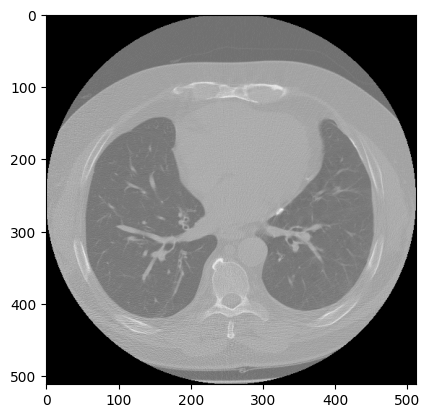

In [45]:
plt.imshow(ct_norm[57], cmap="gray")

In [46]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))  # CLAHE(Contrast Limited Adaptive Histogram Equalization) filter for enhancing the contrast of an image
ct_norm_improved = []
for layer in ct_norm:
    ct_norm_improved.append(clahe.apply(layer.astype(np.uint8)))  # Applying CLAHE filter to the image

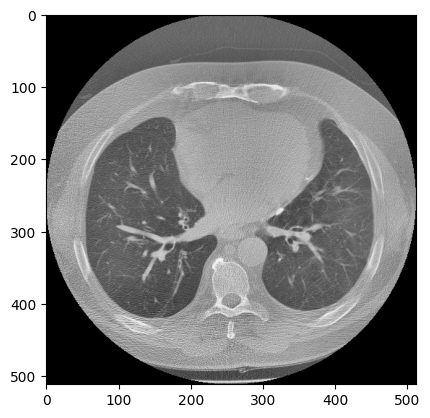

In [47]:
plt.imshow(ct_norm_improved[57], cmap="gray")

In [48]:
centeral_area = ct_norm_improved[len(ct_norm_improved)//2][100:400, 100:400]
kmeans = KMeans(n_clusters=2).fit(np.reshape(centeral_area, [np.prod(centeral_area.shape), 1]))
centroids = sorted(kmeans.cluster_centers_.flatten())
threshold = np.mean(centroids)
print(threshold)

120.3353800019649


In [49]:
lung_masks = []
for layer in ct_norm_improved:
    ret, lung_roi = cv2.threshold(layer, threshold, 255, cv2.THRESH_BINARY_INV)
    lung_roi = cv2.erode(lung_roi, kernel=np.ones([4,4]))
    lung_roi = cv2.dilate(lung_roi, kernel=np.ones([13,13]))
    lung_roi = cv2.erode(lung_roi, kernel=np.ones([8,8]))

    labels = measure.label(lung_roi)        # Labelling different regions in the image
    regions = measure.regionprops(labels)   # Extracting the properties of the regions
    good_labels = []
    for prop in regions:        # Filtering the regions that are not too close to the edges
        B = prop.bbox           # Regions that are too close to the edges are outside regions of lungs
        if B[2]-B[0] < 475 and B[3]-B[1] < 475 and B[0] > 40 and B[2] < 472:
            good_labels.append(prop.label)
    lung_roi_mask = np.zeros_like(labels)
    for N in good_labels:
        lung_roi_mask = lung_roi_mask + np.where(labels == N, 1, 0)

    # Steps to get proper segmentation of the lungs without noise and holes
    contours, hirearchy = cv2.findContours(lung_roi_mask,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)
    external_contours = np.zeros(lung_roi_mask.shape)
    for i in range(len(contours)):
        if hirearchy[0][i][3] == -1:  #External Contours
            area = cv2.contourArea(contours[i])
            if area>518.0:
                cv2.drawContours(external_contours,contours,i,(1,1,1),-1)
    external_contours = cv2.dilate(external_contours, kernel=np.ones([4,4]))

    external_contours = cv2.bitwise_not(external_contours.astype(np.uint8))
    external_contours = cv2.erode(external_contours, kernel=np.ones((7,7)))
    external_contours = cv2.bitwise_not(external_contours)
    external_contours = cv2.dilate(external_contours, kernel=np.ones((12,12)))
    external_contours = cv2.erode(external_contours, kernel=np.ones((12,12)))

    external_contours = external_contours.astype(np.uint8)      # Final segmentated lungs mask
    lung_masks.append(external_contours)

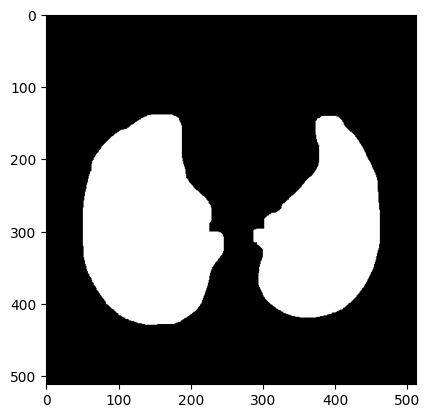

In [50]:
plt.imshow(lung_masks[57], cmap="gray")

In [51]:
extracted_lungs = []
for lung, mask in zip(ct_norm_improved,lung_masks):
    extracted_lungs.append(cv2.bitwise_and(lung, lung, mask=mask))

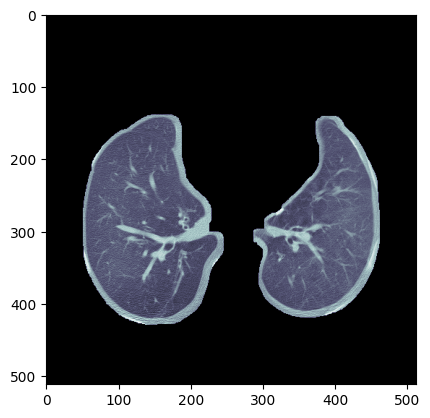

In [53]:
plt.imshow(extracted_lungs[57], cmap="bone")

In [54]:
X = np.array(extracted_lungs)
X.shape

(121, 512, 512)

In [55]:
X = (X-127.0)/127.0
X = X.astype(np.float32)
X.dtype

dtype('float32')

In [56]:
print("Min:",X.min(),"\nMax:",X.max())

Min: -1.0 
Max: 0.9212598


In [57]:
X = np.reshape(X, (len(X), 512, 512, 1))
X.shape

(121, 512, 512, 1)

In [58]:
predictions = model.predict(X)
predictions.shape

4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step


(121, 512, 512, 1)

In [59]:
print("Dtype:",predictions.dtype,"\nMin:",predictions.min(),"\nMax:",predictions.max())

Dtype: float32 
Min: 0.0 
Max: 1.0


In [60]:
predictions[predictions>=0.5] = 255
predictions[predictions<0.5] = 0
predictions = predictions.astype(np.uint8)

In [61]:
pred = list(predictions)
pred = [np.squeeze(i) for i in pred]

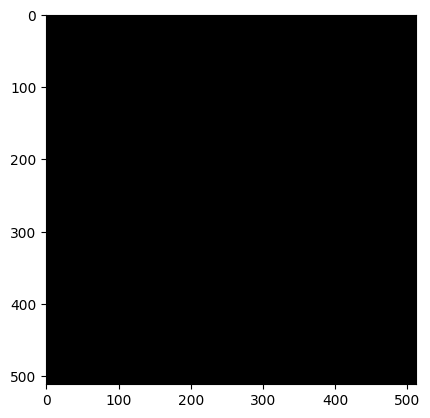

In [62]:
plt.imshow(pred[70], cmap="gray")

In [63]:
def display(imgs,mask):
    j = 1
    for im,mk in zip(imgs,mask):
        plt.figure(figsize=(20,300))
        plt.subplot(50,3,j)
        plt.imshow(np.squeeze(im), cmap="gray")
        plt.subplot(50,3,j+1)
        plt.imshow(np.squeeze(mk), cmap="gray")
        plt.subplot(50,3,j+2)
        plt.imshow(cv2.addWeighted(np.squeeze(im), .5, np.squeeze(mk), .5, 0), cmap="gray")
        j += 3

In [64]:
def display2(imgs, titles=None, cmap="bone"):
    n = len(list(imgs))
    r = n//3 if n%3==0 else (n//3)+1
    plt.figure(figsize=(25,int(8*r)))
    for i,img in enumerate(imgs):
        plt.subplot(r,3,i+1)
        if titles is not None:
            plt.title(titles[i])
        plt.imshow(img, cmap=cmap)

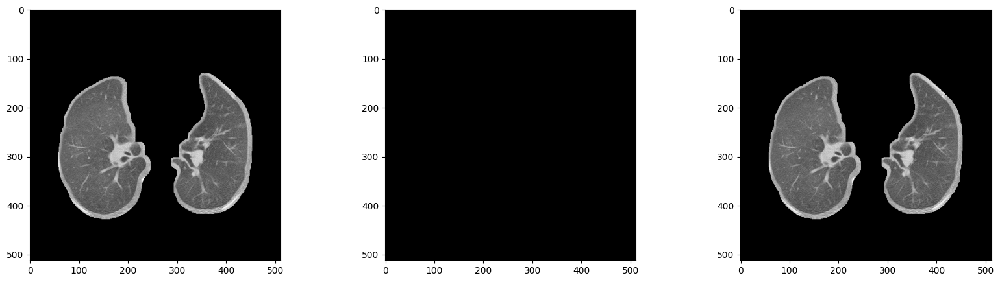

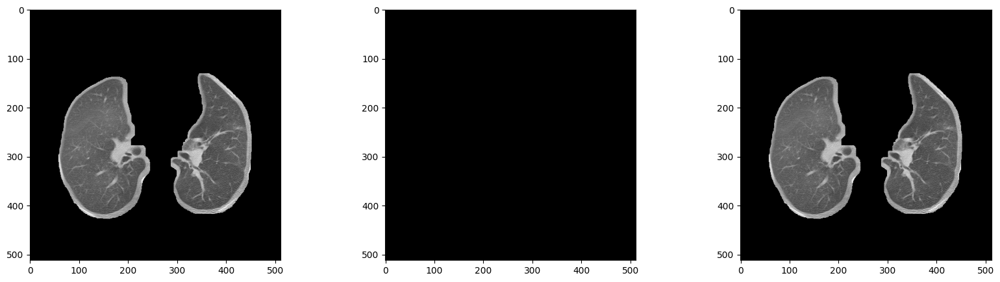

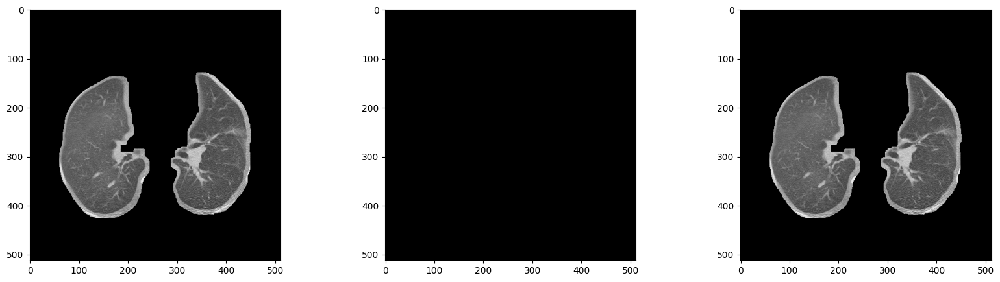

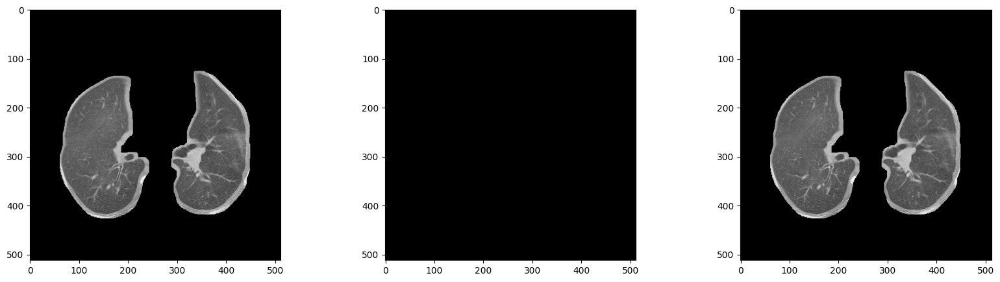

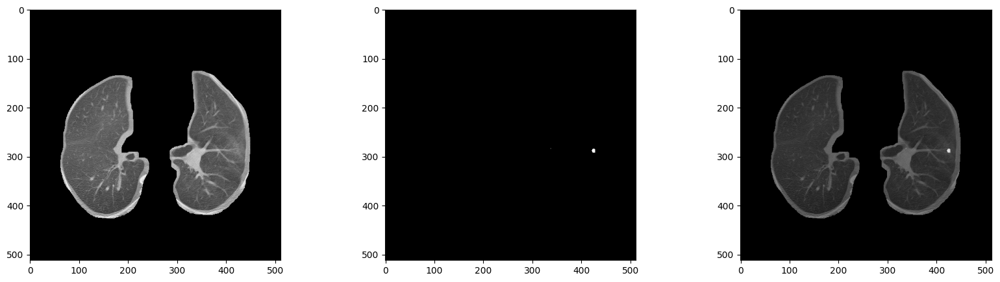

In [65]:
display(extracted_lungs[65:70],pred[65:70])

In [66]:
bboxes = []
centroids = []
diams = []
for mask in pred:
    mask = cv2.dilate(mask, kernel=np.ones((5,5)))
    labels = measure.label(mask)
    regions = measure.regionprops(labels)
    bb = []
    cc = []
    dd = []
    for prop in regions:
        B = prop.bbox
        C = prop.centroid
        D = prop.equivalent_diameter_area
        bb.append((( max(0, B[1]-8), max(0, B[0]-8) ),( min(B[3]+8, 512), min(B[2]+8, 512) )))    # ((x1,y1),(x2,y2))
        cc.append(C)    # (y,x)
        dd.append(D)
    bboxes.append(bb)
    centroids.append(cc)
    diams.append(dd)

In [67]:
bboxes[65:71]

[[], [], [], [], [((327, 274), (348, 295)), ((411, 275), (438, 303))], []]

In [68]:
centroids[65:71]

[[], [], [], [], [(284.0, 337.0), (288.5447154471545, 424.2682926829268)], []]

In [69]:
diams[65:71]

[[], [], [], [], [5.641895835477563, 12.514330345744634], []]

In [74]:
video_name = 'extracted_lungs_video.mp4'
frame_height, frame_width = extracted_lungs[0].shape[:2]  
fps = 10  # Frames per second

fourcc = cv2.VideoWriter_fourcc(*'XVID')  
out = cv2.VideoWriter(video_name, fourcc, fps, (frame_width, frame_height))
bs = []
mimgs = copy.deepcopy(extracted_lungs)
for i,(img,boxes) in enumerate(zip(mimgs,bboxes)):
    for rect in boxes:
        img = cv2.rectangle(img, rect[0], rect[1], (255), 2)
        lung_image = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    out.write(lung_image)
out.release()
print(f"Video saved as {video_name}")

Video saved as extracted_lungs_video.mp4


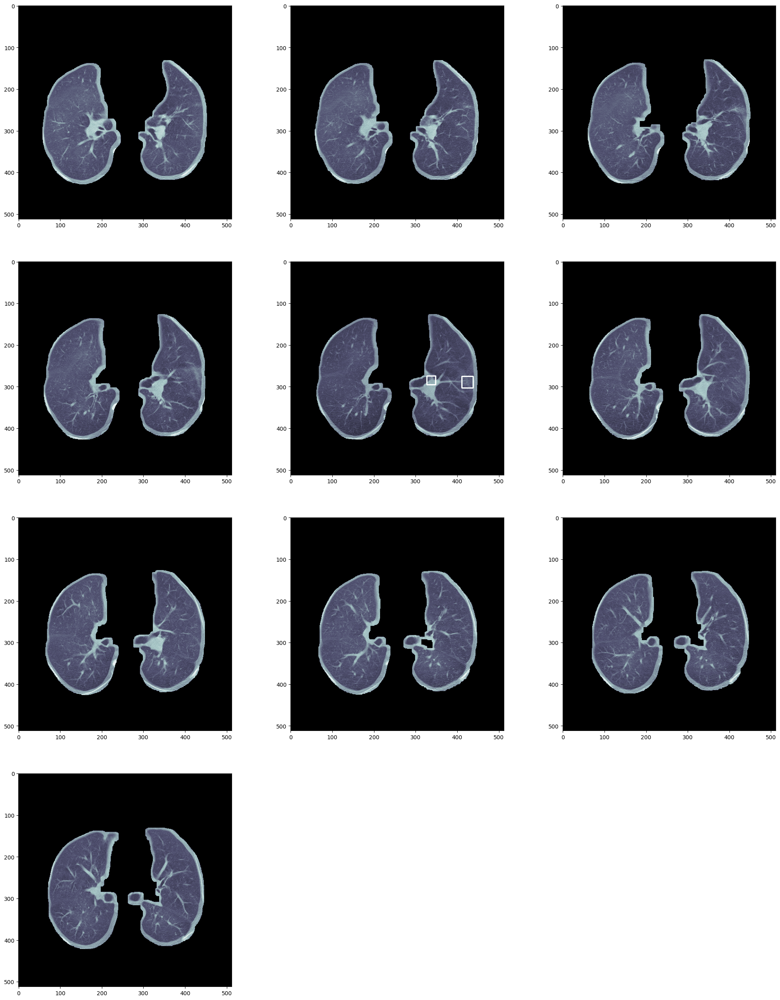

In [71]:
display2(mimgs[65:75])

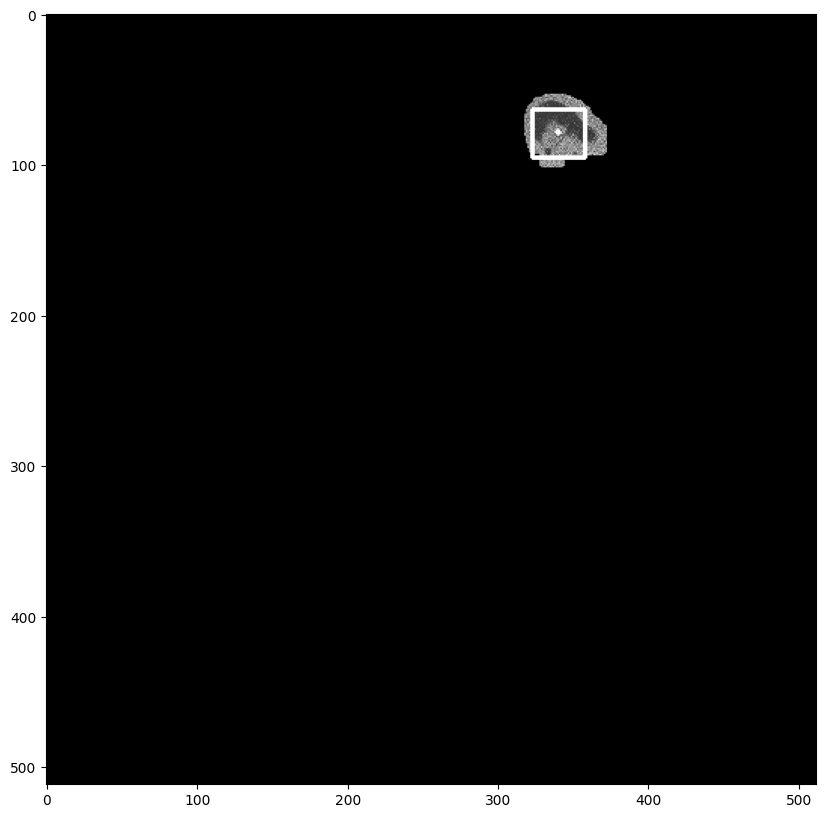

In [72]:
idx =0
v = copy.deepcopy(extracted_lungs)
plt.figure(figsize=(10,10))
i = cv2.rectangle(v[idx], bboxes[idx][0][0], bboxes[idx][0][1], (255), 2)
i = cv2.circle(i, (int(centroids[idx][0][1]), int(centroids[idx][0][0])), 2, (255), -1)
plt.imshow(i, cmap='gray')

In [75]:
fpr_model = tf.keras.models.load_model(r"models\FPR_classifier_model.h5")

c:\Softwares\Python\lib\site-packages\keras\src\optimizers\base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [76]:
originals = copy.deepcopy(ct_norm_improved)
final_boxes = []
for i,(img,bbox) in enumerate(zip(originals, bboxes)):
    img_boxes = []
    for box in bbox:
        x1 = box[0][0]
        y1 = box[0][1]
        x2 = box[1][0]
        y2 = box[1][1]
        if abs(x1-x2) <=50 or abs(y1-y2)<=50:
            x = (x1+x2)//2
            y = (y1+y2)//2
            x1 = max(x-25, 0)
            x2 = min(x+25, 512)
            y1 = max(y-25, 0)
            y2 = min(y+25, 512)
            imgbox = img[y1:y2,x1:x2]
            img_boxes.append(imgbox)
        else:
            imgbox = img[y1:y2,x1:x2]
            img_boxes.append(imgbox)
    final_boxes.append(img_boxes)

In [77]:
plt.figure(figsize=(15,15))
for i,img in enumerate(final_boxes[66]):
    plt.subplot(1,6,i+1)
    plt.imshow(img, cmap="gray")

<Figure size 1500x1500 with 0 Axes>

In [78]:
fpr_preds = []
for i in final_boxes:
    each_p = []
    for img in i:
        if img.shape != (50,50):
            img = np.resize(img, (50,50))
        img = img/255.
        img = np.reshape(img, (1,50,50,1))
        pred = fpr_model.predict(img)
        pred = int(pred>=0.5)
        each_p.append(pred)
    fpr_preds.append(each_p)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\Mr.LogicLeo\AppData\Local\Temp\ipykernel_3016\316779744.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pred = int(pred>=0.5)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


In [79]:
bboxes[66]

[]

In [80]:
for i in range(len(diams)):
    if len(diams[i]):
        for j in range(len(diams[i])):
            diams[i][j] = diams[i][j]*space[0]       # diameters in mm

In [81]:
final_img_bbox = []
cancer = []
df = pd.DataFrame(columns = ['Layer', 'Position (x,y)', 'Diameter (mm)', 'BBox [(x1,y1),(x2,y2)]'])
e_lungs = copy.deepcopy(ct_norm_improved)
for i,(img,bbox,preds,cents,dms) in enumerate(zip(e_lungs, bboxes, fpr_preds, centroids, diams)):
    token = False
    for box,pred,cent,dm in zip(bbox,preds,cents,dms):
        if pred:
            x1 = box[0][0]
            y1 = box[0][1]
            x2 = box[1][0]
            y2 = box[1][1]
            img = cv2.rectangle(img, (x1,y1), (x2,y2), (255), 2)
            dct = pd.DataFrame({'Layer':i, 'Position (x,y)':[f"{cent[::-1]}"], 'Diameter (mm)':dm, 'BBox [(x1,y1),(x2,y2)]':[f"{list(box)}"]})
            df = pd.concat([df,dct], ignore_index = True)
            token = True
    final_img_bbox.append(img)
    cancer.append(token)

C:\Users\Mr.LogicLeo\AppData\Local\Temp\ipykernel_3016\1236166578.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df,dct], ignore_index = True)


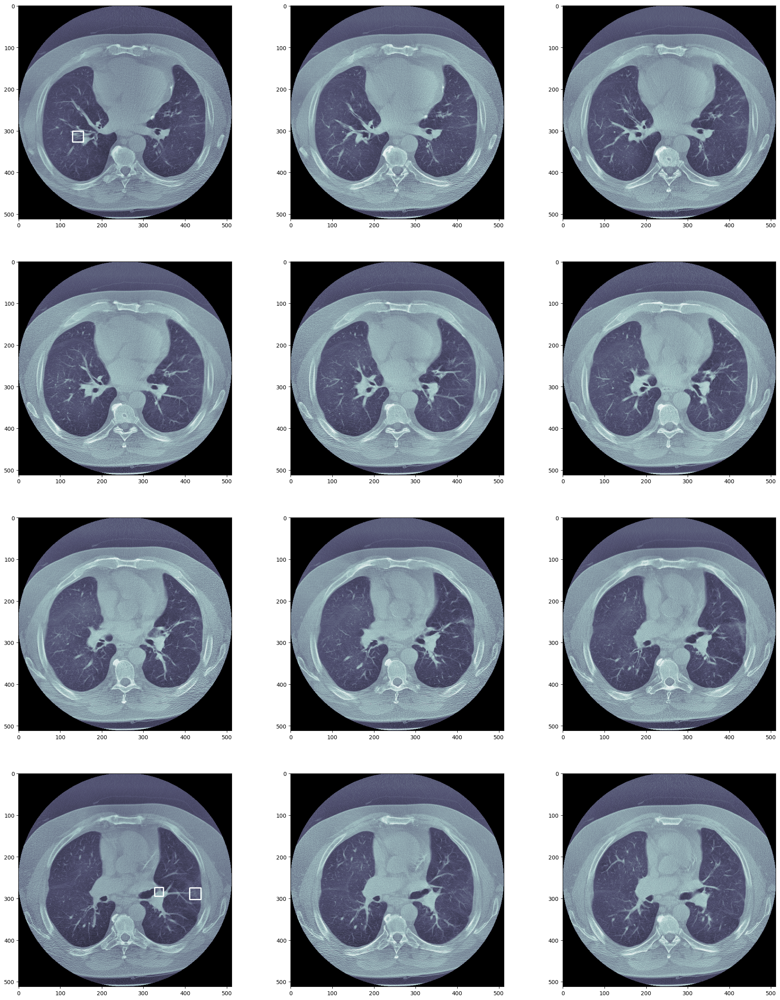

In [82]:
display2(final_img_bbox[60:72])

In [145]:
video_name = 'extracted_lungs_video.avi'
frame_height, frame_width = extracted_lungs[0].shape[:2]  
fps = 10  
fourcc = cv2.VideoWriter_fourcc(*'XVID')  
out = cv2.VideoWriter(video_name, fourcc, fps, (frame_width, frame_height))

for lung_image in final_img_bbox:
    if len(lung_image.shape) == 2: 
        lung_image = cv2.cvtColor(lung_image, cv2.COLOR_GRAY2BGR)
    out.write(lung_image)
out.release()
print(f"Video saved as {video_name}")


Video saved as extracted_lungs_video.avi


In [146]:
cancer[60:72]

[True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False]

In [147]:
df = df.reset_index(drop=True)
df.head()

,Layer,"Position (x,y)",Diameter (mm),"BBox [(x1,y1),(x2,y2)]"
0,5,"(168.97, 104.095)",11.563087,"[(154, 88), (185, 121)]"
1,8,"(164.55223880597015, 102.04477611940298)",6.692620,"[(153, 90), (177, 115)]"
2,23,"(60.62658227848101, 363.28164556962025)",14.534575,"[(42, 345), (80, 383)]"
3,25,"(177.36046511627907, 372.33720930232556)",7.582423,"[(165, 360), (191, 386)]"
4,45,"(442.078431372549, 219.7450980392157)",8.257696,"[(429, 207), (456, 233)]"
